#$\color{Gray}{EXPLORATORY \ \ DATA \ \ ANALYSIS \ \ ON \ \ A \ \ DATASET}$

# Objective:
The main goal of this assignment is to conduct a thorough exploratory analysis of the "cardiographic.csv" dataset to uncover insights, identify patterns, and understand the dataset's underlying structure. You will use statistical summaries, visualizations, and data manipulation techniques to explore the dataset comprehensively.


# Dataset:
1. **LB** - Likely stands for "Baseline Fetal Heart Rate (FHR)" which represents the average fetal heart rate over a period.
2. **AC** - Could represent "Accelerations" in the FHR. Accelerations are usually a sign of fetal well-being.
3. **FM** - May indicate "Fetal Movements" detected by the monitor.
4. **UC** - Likely denotes "Uterine Contractions", which can impact the FHR pattern.
5. **DL** - Could stand for "Decelerations Late" with respect to uterine contractions, which can be a sign of fetal distress.
6. **DS** - May represent "Decelerations Short" or decelerations of brief duration.
7. **DP** - Could indicate "Decelerations Prolonged", or long-lasting decelerations.
8. **ASTV** - Might refer to "Percentage of Time with Abnormal Short Term Variability" in the FHR.
9. **MSTV** - Likely stands for "Mean Value of Short Term Variability" in the FHR.
10. **ALTV** - Could represent "Percentage of Time with Abnormal Long Term Variability" in the FHR.
11. **MLTV** - Might indicate "Mean Value of Long Term Variability" in the FHR.
12. **Width** - histogram width
13. **Tendency** - histogram tendency: -1=left assymetric; 0=symmetric; 1=right assymetric
14. **NSP** - Normal=1; Suspect=2; Pathologic=3

In [1]:
# @title $Import \ \ Libraries$
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (9,6)
plt.rcParams['figure.dpi']= 150

import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

# Task

In [2]:
# @title $Upload \ \ Dataset$
df = pd.read_csv("Cardiotocographic.csv")
df.head()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,120.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,73.0,0.5,43.0,2.4,64.0,0.999926,2.0
1,132.000000,0.006380,0.0,0.006380,0.003190,0.0,0.0,17.0,2.1,0.0,10.4,130.0,0.000000,1.0
2,133.000000,0.003322,0.0,0.008306,0.003322,0.0,0.0,16.0,2.1,0.0,13.4,130.0,0.000000,1.0
3,134.000000,0.002561,0.0,0.007742,0.002561,0.0,0.0,16.0,2.4,0.0,23.0,117.0,1.000000,1.0
4,131.948232,0.006515,0.0,0.008143,0.000000,0.0,0.0,16.0,2.4,0.0,19.9,117.0,1.000000,1.0


In [3]:
# @title $Dataset \ \ Info$
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   LB        2105 non-null   float64
 1   AC        2106 non-null   float64
 2   FM        2126 non-null   float64
 3   UC        2126 non-null   float64
 4   DL        2126 non-null   float64
 5   DS        2105 non-null   float64
 6   DP        2105 non-null   float64
 7   ASTV      2126 non-null   float64
 8   MSTV      2126 non-null   float64
 9   ALTV      2126 non-null   float64
 10  MLTV      2105 non-null   float64
 11  Width     2105 non-null   float64
 12  Tendency  2105 non-null   float64
 13  NSP       2105 non-null   float64
dtypes: float64(14)
memory usage: 232.7 KB


In [4]:
# @title $Dataset \ \ Description$
df.describe()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
count,2105.000000,2106.000000,2126.000000,2126.000000,2126.000000,2105.000000,2105.000000,2126.000000,2126.000000,2126.000000,2105.000000,2105.000000,2105.000000,2105.000000
mean,133.343598,0.003219,0.009894,0.004391,0.001895,0.000003,0.000175,46.995984,1.364378,10.285964,8.284887,70.429260,0.316371,1.304507
std,11.270154,0.004391,0.067540,0.003340,0.003343,0.000142,0.000840,18.813973,1.173632,21.205041,7.772858,42.931822,0.645622,0.644619
min,51.842487,-0.019284,-0.480634,-0.014925,-0.015393,-0.001353,-0.005348,-63.000000,-6.600000,-91.000000,-50.700000,-174.000000,-3.000000,-1.025988
25%,126.000000,0.000000,0.000000,0.001851,0.000000,0.000000,0.000000,32.000000,0.700000,0.000000,4.600000,37.000000,0.000000,1.000000
50%,133.000000,0.001634,0.000000,0.004484,0.000000,0.000000,0.000000,49.000000,1.200000,0.000000,7.400000,67.000000,0.000000,1.000000
75%,140.000000,0.005650,0.002567,0.006536,0.003289,0.000000,0.000000,61.000000,1.700000,11.000000,10.900000,100.000000,1.000000,1.000000
max,214.000000,0.038567,0.961268,0.030002,0.030769,0.002706,0.010695,162.000000,13.800000,182.000000,101.400000,357.000000,3.000000,5.000000


Entries in the above columns can not be negative

#1.	Data Cleaning and Preparation:
●	Load the dataset into a DataFrame or equivalent data structure.

●	Handle missing values appropriately (e.g., imputation, deletion).

●	Identify and correct any inconsistencies in data types (e.g., numerical values stored as strings).

●	Detect and treat outliers if necessary.


## Handle Duplicate Records

In [5]:
# @title $Check \ \ no. \ of \ \ duplicate \ \ entries$
df.duplicated().sum()

2

In [6]:
# @title $Drop \ \ duplicate \ \ entires$
df.drop_duplicates(inplace=True)

* Values in columns 'Width', 'Tendency', and 'NSP' are categorical in nature, but in dataset some float values are present so, we will round the float values to the nearest integers

## Check negative values in each column

In [7]:
# @title $No. \ of \ \ negative \ \ entries \ \ in \ \ each \ \ column$
for col in df.columns:
    print(col, df[df[col]<0][col].count())

LB 0
AC 29
FM 54
UC 13
DL 36
DS 53
DP 52
ASTV 5
MSTV 3
ALTV 37
MLTV 11
Width 5
Tendency 202
NSP 6


### Check if negative values are from some specific rows

In [8]:
# @title $Rows \ \ which \ \ contains \ \ negative \ \ entries$
new_df=df.copy()
new_df.drop(columns=['Tendency'], inplace=True)
new_df[(new_df < 0).any(axis=1)]

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,NSP
6,134.0,0.001403,0.000000,0.012623,0.008415,0.000000e+00,0.002805,29.0,6.3,0.000000,0.0,150.0,-1.025988
12,131.0,0.005076,0.072335,0.007614,0.002538,0.000000e+00,0.000000,28.0,1.4,-0.702936,12.9,66.0,1.000000
17,131.0,0.001524,0.382622,0.003049,0.004573,0.000000e+00,0.001524,18.0,2.4,-0.546430,13.9,107.0,2.000000
23,128.0,-0.019284,0.000000,0.000000,0.000000,0.000000e+00,0.000000,80.0,0.5,0.000000,6.8,16.0,3.000000
25,124.0,0.000000,0.000000,0.000000,-0.000035,0.000000e+00,0.000000,86.0,0.3,72.000000,4.0,12.0,3.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2080,130.0,0.003003,0.002002,0.001001,0.000000,-2.120000e-06,0.000000,74.0,1.3,8.000000,5.0,32.0,1.000000
2088,133.0,0.000000,0.001236,0.006180,0.000000,-8.720000e-07,0.000000,79.0,0.5,70.000000,3.1,10.0,1.000000
2102,133.0,-0.000091,0.006031,0.007238,0.000000,0.000000e+00,-0.000026,68.0,3.0,1.000000,1.3,57.0,1.000000
2105,136.0,0.000000,-0.001545,0.009324,0.000000,0.000000e+00,0.000000,79.0,0.2,40.000000,5.1,20.0,1.000000


* **Note:** Negative values are not from some specific rows

## Handle Null Entries

In [9]:
# @title $Check \ \  no. \ of \ \ Null \ \ Entries$
df.isnull().sum()

LB          21
AC          20
FM           0
UC           0
DL           0
DS          21
DP          21
ASTV         0
MSTV         0
ALTV         0
MLTV        21
Width       21
Tendency    21
NSP         21
dtype: int64

### Check if null entries are from some specific rows

In [10]:
# @title $Rows \ \ which \ \ contains \ \ null \ \ entries$
df[df.isnull().any(axis=1)]

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
50,NaN,NaN,0.000000,0.008086,0.000000,NaN,NaN,29.000000,1.300000,0.000000,NaN,NaN,NaN,NaN
116,NaN,0.038567,0.000000,0.006993,0.002331,NaN,NaN,26.000000,4.300000,0.532872,NaN,NaN,NaN,NaN
126,NaN,NaN,0.000000,0.004380,0.000000,NaN,NaN,69.000000,0.300000,21.000000,NaN,NaN,NaN,NaN
201,NaN,NaN,0.016393,0.000000,0.000000,NaN,NaN,56.000000,0.500000,12.000000,NaN,NaN,NaN,NaN
566,NaN,NaN,0.000000,0.004115,0.005487,NaN,NaN,43.000000,2.500000,0.000000,NaN,NaN,NaN,NaN
574,NaN,NaN,0.000000,0.002611,0.002611,NaN,NaN,34.000000,4.900000,0.000000,NaN,NaN,NaN,NaN
603,NaN,NaN,0.006519,0.001304,0.001304,NaN,NaN,73.000000,0.700000,0.000000,NaN,NaN,NaN,NaN
935,NaN,NaN,0.000000,0.005495,0.001374,NaN,NaN,30.000000,1.251793,0.000000,NaN,NaN,NaN,NaN
936,NaN,NaN,0.000000,0.007802,0.000000,NaN,NaN,33.000000,1.000000,0.000000,NaN,NaN,NaN,NaN
1013,NaN,NaN,0.000000,0.003861,0.000000,NaN,NaN,34.000000,1.000000,0.000000,NaN,NaN,NaN,NaN


* **Note** Almost all NaN entries are from these specific rows, so we will delete these rows

In [11]:
# @title $Delete \ \ rows \ \ containing \ \ NaN \ \ values$
df.dropna(inplace=True)
df.isnull().sum()

LB          0
AC          0
FM          0
UC          0
DL          0
DS          0
DP          0
ASTV        0
MSTV        0
ALTV        0
MLTV        0
Width       0
Tendency    0
NSP         0
dtype: int64

## Handle irregular entries

* **Note:** Entries in columns Width, Tendency and NSP are categorical, so we will first round the float entries

In [12]:
# @title $Apply \ \ .round() \ \ on \ \ columns \ \ Width, \ \ Tendency \ \ and \ \ NSP$
df['Width'] = df['Width'].round()
df['Tendency'] = df['Tendency'].round()
df['NSP'] = df['NSP'].round()

Column : Width


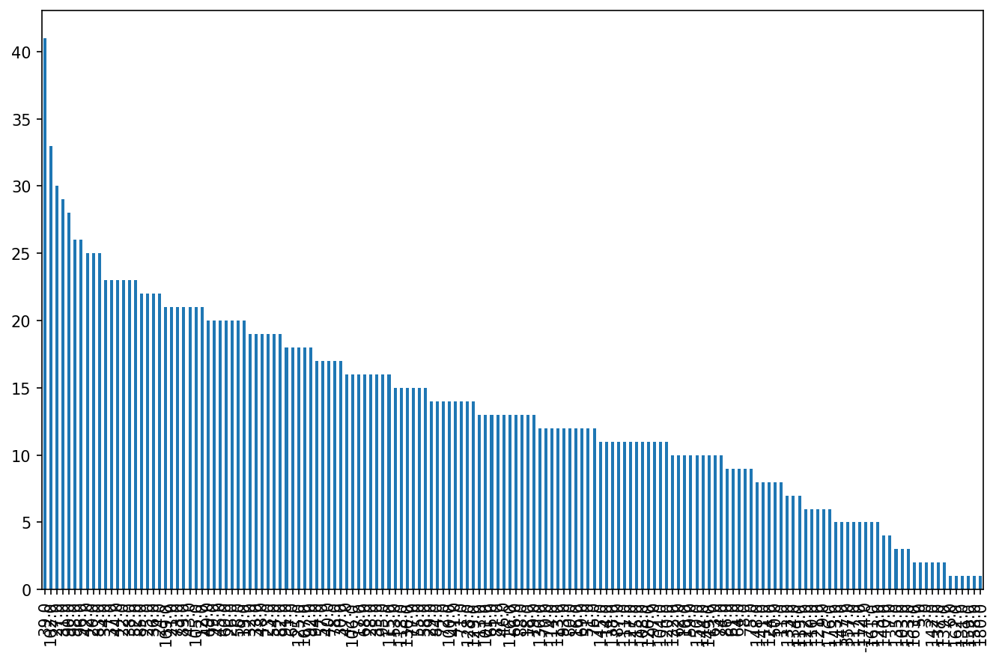

Column : Tendency


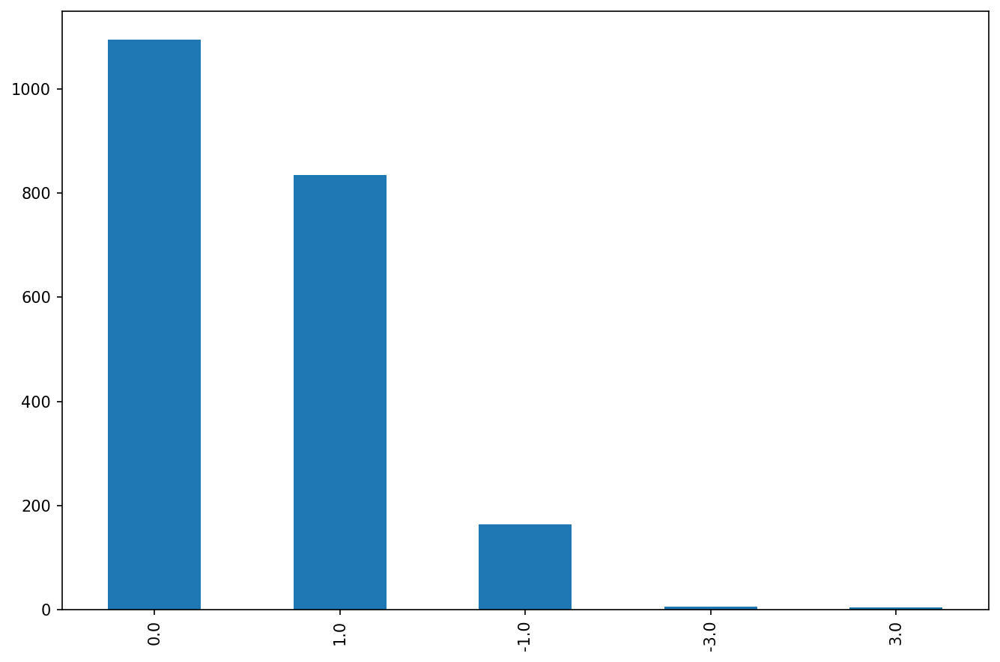

Column : NSP


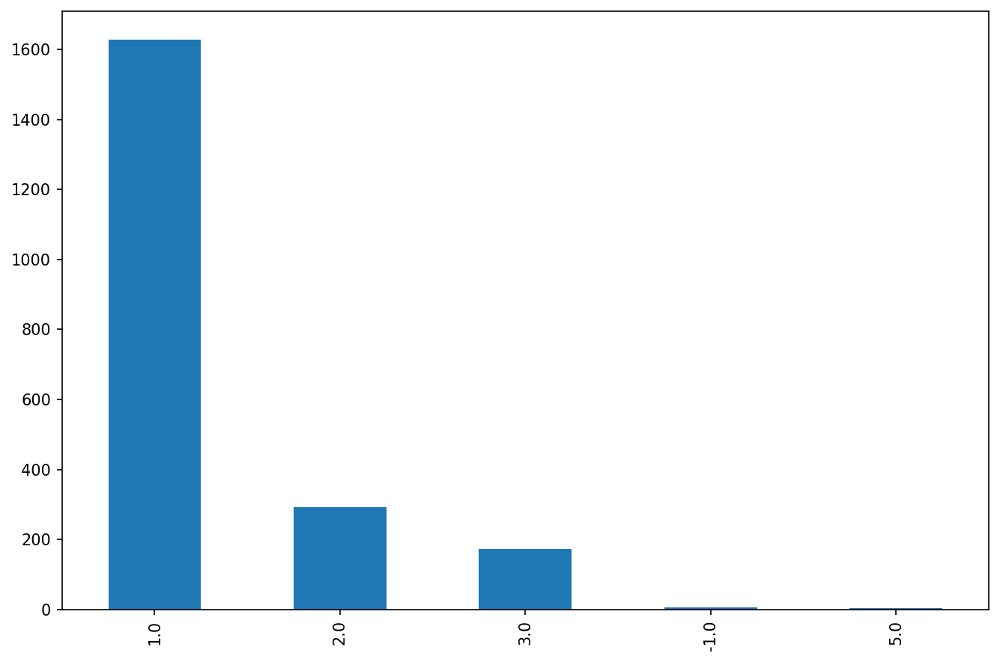

In [13]:
# @title $Barplot \ \ for \ \ Width, \ \ Tendency \ \ and \ \ NSP$

for col in ['Width', 'Tendency', 'NSP']:
    print('Column :', col)
    df[col].value_counts().plot(kind='bar')
    plt.tight_layout()
    plt.show()

### Imputation for column NSP

In [14]:
# @title $value\_counts \ \ for \ \ NSP$
df['NSP'].value_counts()

 1.0    1628
 2.0     293
 3.0     172
-1.0       6
 5.0       4
Name: NSP, dtype: int64

NSP is a categorical column with values 1,2 and 3. Hence we will replace -1 by 1 and 5 by 3

In [15]:
# @title $Replacement$
df['NSP'].replace({-1.0: 1.0, 5.0: 3.0}, inplace=True)

### Imputation for column Tendency

In [16]:
# @title $value\_counts \ \ for \ \ Tendency$
df['Tendency'].value_counts()

 0.0    1095
 1.0     835
-1.0     163
-3.0       6
 3.0       4
Name: Tendency, dtype: int64

Tendency is a categorical column with values -1,0 and 1. Hence we will replace -3 by -1 and 3 by 1

In [17]:
# @title $Replacement$
df['Tendency'].replace  ({-3.0:-1.0, 3.0: 1}, inplace=True)

### Imputation for Negative Entries

* **Note:** Width can not be negative, so we will replace negative width by NaN

In [18]:
# @title $Check \ \ no. \ of \ \ negative \ \ values \ \ in \ \ each \ \ column$

for col in df.columns:
    print(col, df[df[col]<0][col].count())

LB 0
AC 29
FM 52
UC 13
DL 36
DS 53
DP 52
ASTV 5
MSTV 3
ALTV 37
MLTV 11
Width 5
Tendency 169
NSP 0


In [19]:
# @title $Negative \ \ values \ \ in \ \ each \ \ column$
for col in df.columns:
    print('Column :', col)
    print(df[df[col]<0][col])
    print('----------------------------')

Column : LB
Series([], Name: LB, dtype: float64)
----------------------------
Column : AC
23     -0.019284
28     -0.000040
31     -0.000112
87     -0.000156
88     -0.000052
157    -0.019284
206    -0.000030
345    -0.000007
404    -0.000010
447    -0.000006
473    -0.000006
646    -0.000185
681    -0.019284
779    -0.000056
946    -0.000122
969    -0.000055
1057   -0.000005
1090   -0.000072
1265   -0.000117
1270   -0.000068
1445   -0.000053
1600   -0.000100
1604   -0.000109
1708   -0.000073
1752   -0.019284
1773   -0.000068
1880   -0.000054
2055   -0.000118
2102   -0.000091
Name: AC, dtype: float64
----------------------------
Column : FM
60     -0.002304
61     -0.001776
66     -0.001202
149    -0.000705
174    -0.000155
198    -0.000515
229    -0.480634
233    -0.001593
431    -0.000325
480    -0.000325
557    -0.000519
564    -0.001160
586    -0.480634
747    -0.001190
826    -0.001510
867    -0.001687
976    -0.480634
996    -0.480634
1029   -0.002076
1064   -0.003435
1070   -0.0

* **Note:** In the columns 'ASTV', 'MSTV', 'Width', 'ALTV', 'MLTV' some negative values are very far from other values, so we will replace those values by np.nan

In [20]:
# @title $Replacement$
df['ASTV'].replace({-63.0: np.nan}, inplace=True)
df['MSTV'].replace({-6.6: np.nan}, inplace=True)
df['Width'].replace({-174.0: np.nan}, inplace=True)
df['ALTV'].replace({-91.0: np.nan}, inplace=True)
df['MLTV'].replace({-50.700000: np.nan}, inplace=True)

## Handle Missing Entries

In [21]:
# @title $Check \ \ missing \ \ values$
df.isnull().sum()

LB          0
AC          0
FM          0
UC          0
DL          0
DS          0
DP          0
ASTV        5
MSTV        3
ALTV        3
MLTV        5
Width       5
Tendency    0
NSP         0
dtype: int64

### Missing values Imputation

In [22]:
# @title $Replace \ \ missing \ \ values \ \ by \ \ median$
df.fillna(df.median(), inplace=True)
df.isnull().sum()

LB          0
AC          0
FM          0
UC          0
DL          0
DS          0
DP          0
ASTV        0
MSTV        0
ALTV        0
MLTV        0
Width       0
Tendency    0
NSP         0
dtype: int64

## Handling Outliers

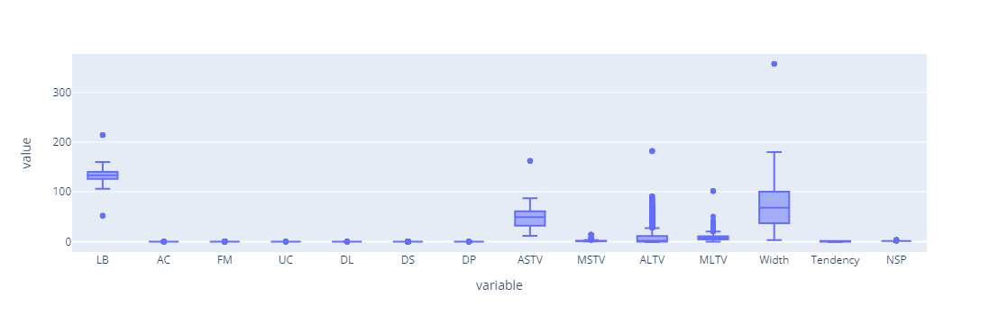

In [23]:
# @title $Boxplot$

import plotly.express as px

# Create a boxplot using Plotly Express
fig = px.box(df)

# Display the boxplot
fig.show()


Capping outliers from the columns 'LB', 'ASTV', 'ALTV', 'MLTV', 'Width',

In [24]:
# @title $Outliers \ \ Capping$

data = df.copy()
# Outliers are present in the following columns
#outliers_columns = ['LB', 'ASTV','MSTV', 'ALTV', 'MLTV', 'Width']
outliers_columns = data.columns.tolist()
for col in ['DS', 'DP', 'NSP']:
    if col in outliers_columns:
        outliers_columns.remove(col)

#outlier_detection
def outlier_detection(data, col_name):
    Q1 = data[col_name].quantile(0.25)
    Q3 = data[col_name].quantile(0.75)
    IQR = Q3-Q1
    LE = Q1 - 1.5*IQR
    UE = Q3 + 1.5*IQR
    #return data.index[(data[col_name] < LE) | (data[col_name] > UE)].tolist()
    return LE,UE

# Dictionary for lower and upper extreme
LU_Extremes = {}
for col in outliers_columns:
    LU_Extremes[col] = outlier_detection(data, col)
LU_Extremes

# Outliers Capping
for col in LU_Extremes:
    data.loc[data[col] < LU_Extremes[col][0] , col]=LU_Extremes[col][0]
    data.loc[data[col] > LU_Extremes[col][1] , col]=LU_Extremes[col][1]

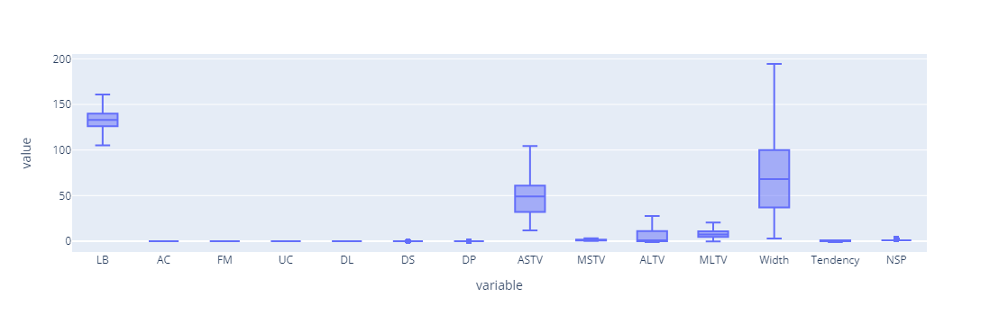

In [25]:
# @title $Boxplot \ \ after \ \ capping$
fig = px.box(data)

# Display the boxplot
fig.show()

#2.	Statistical Summary:
●	Provide a statistical summary for each variable in the dataset, including measures of central tendency (mean, median) and dispersion (standard deviation, interquartile range).

●	Highlight any interesting findings from this summary.

In [26]:
# @title $Dataset \ \ Description$
data.describe()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
count,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000
mean,133.291604,0.003144,0.001565,0.004361,0.001770,0.000003,0.000175,47.143146,1.304765,6.757002,8.046735,70.649311,0.318592,1.306705
std,9.976211,0.003844,0.002477,0.003008,0.002675,0.000142,0.000840,17.400925,0.775847,10.366394,5.055393,39.281073,0.614812,0.616602
min,105.000000,-0.008475,-0.003839,-0.005219,-0.004942,-0.001353,-0.005348,11.799846,0.200000,-1.043619,-0.200788,3.000000,-1.000000,1.000000
25%,126.000000,0.000000,0.000000,0.001838,0.000000,0.000000,0.000000,32.000000,0.700000,0.000000,4.600000,37.000000,0.000000,1.000000
50%,133.000000,0.001631,0.000000,0.004484,0.000000,0.000000,0.000000,49.000000,1.200000,0.000000,7.400000,68.000000,0.000000,1.000000
75%,140.000000,0.005650,0.002559,0.006543,0.003295,0.000000,0.000000,61.000000,1.700000,11.000000,10.900000,100.000000,1.000000,1.000000
max,161.000000,0.014124,0.006398,0.013601,0.008237,0.002706,0.010695,104.500000,3.200000,27.500000,20.350000,194.500000,1.000000,3.000000



1. The standard deviation is relatively high for features like 'LB', 'ASTV', 'ALTV', 'MLTV', 'Width', indicating significant variability in the data.

2. The scales of different columns vary significantly. For example, 'LB' ranges from 105 to 161, while 'AC' only ranges from -0.008409 to 0.014015. This difference in scale should be considered during analysis and visualization.


#3.	Data Visualization and 4.	Pattern Recognition and Insights:
●	Create histograms or boxplots to visualize the distributions of various numerical variables.

●	Use bar charts or pie charts to display the frequency of categories for categorical variables.

●	Generate scatter plots or correlation heatmaps to explore relationships between pairs of variables.

●	Employ advanced visualization techniques like pair plots, or violin plots for deeper insights.


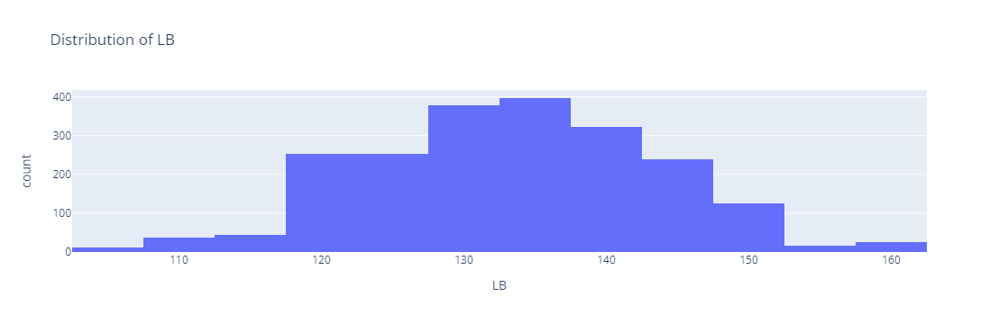

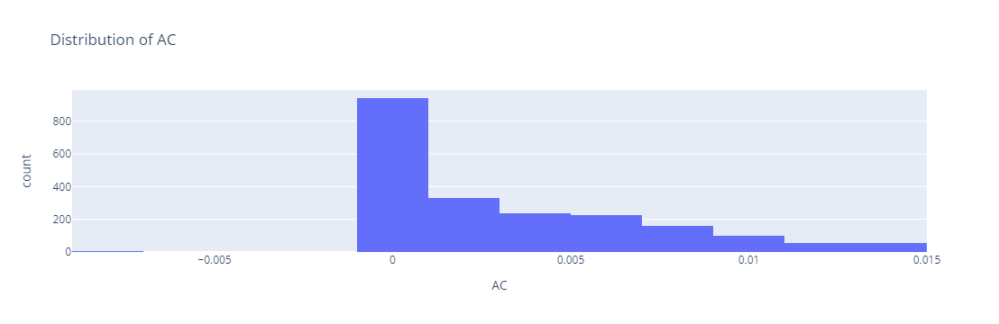

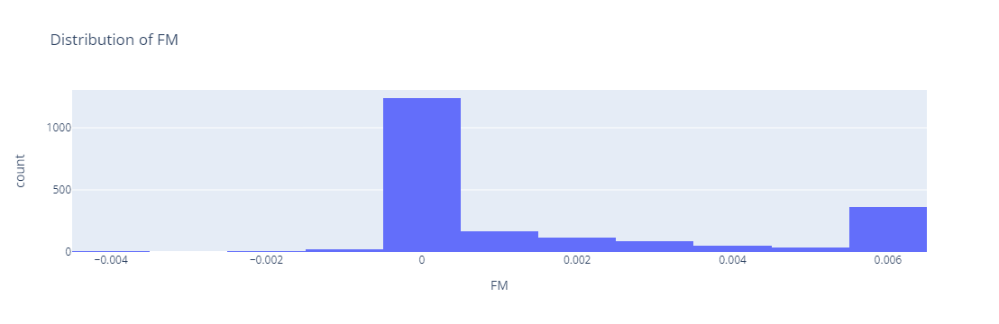

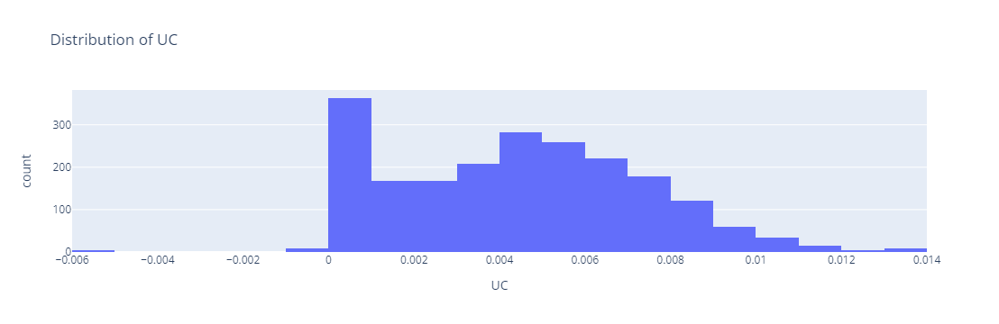

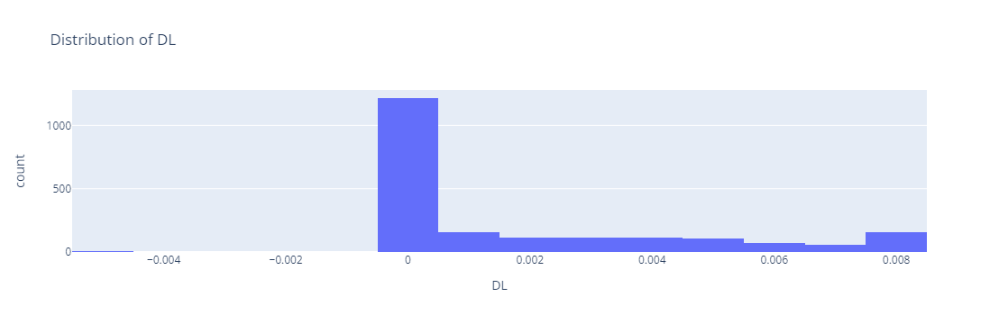

...

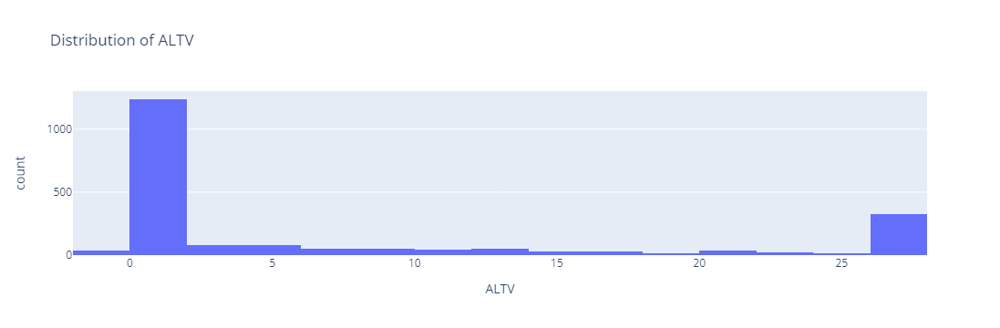

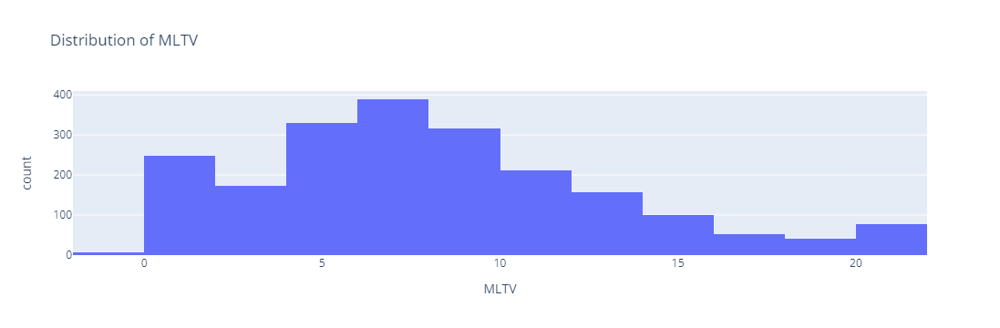

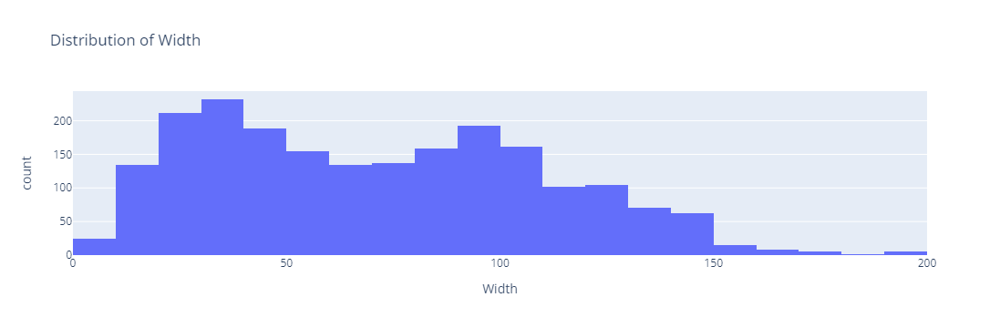

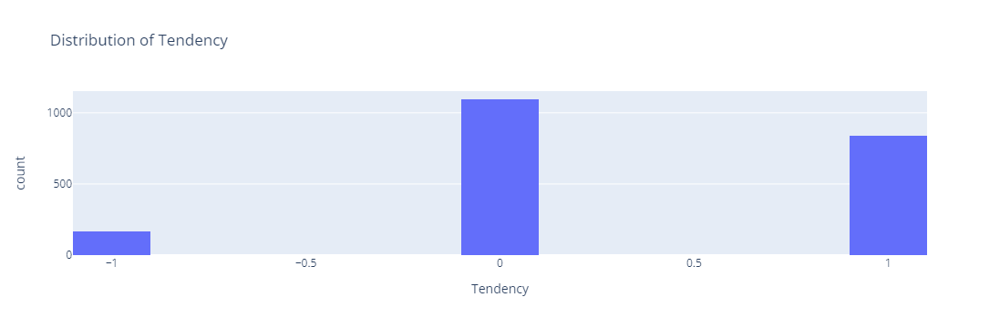

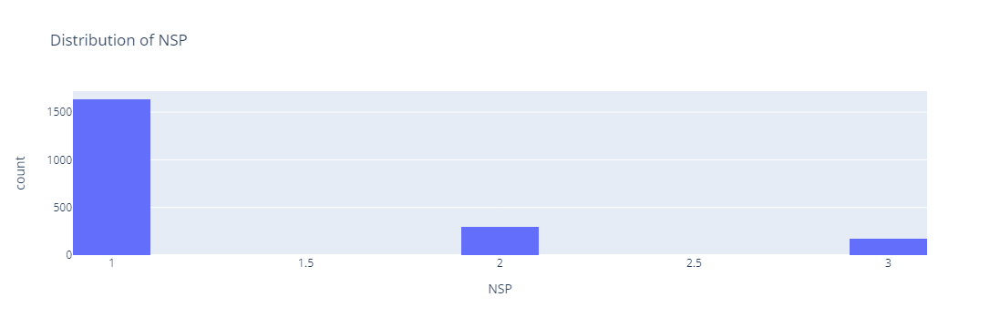

In [27]:
# @title $Histogram$
for col in data.columns:
    fig = px.histogram(data, x=col, nbins=20, title=f"Distribution of {col}")
    fig.show()

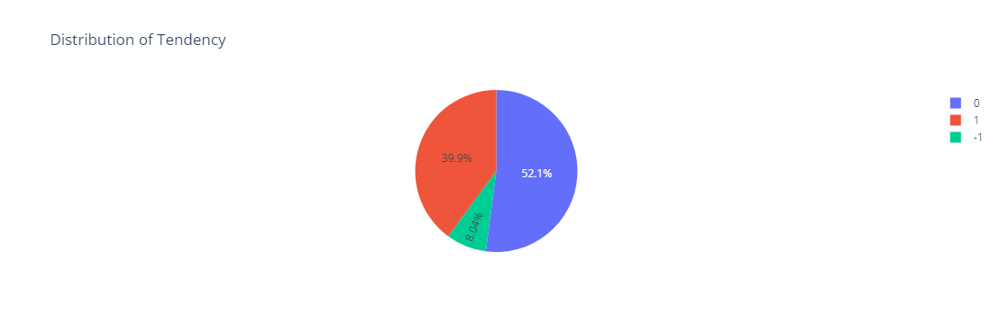

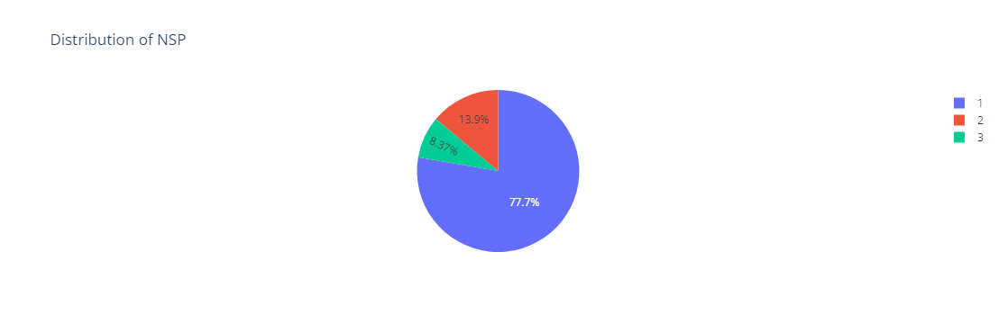

In [28]:
# @title $Pie \ \ charts \ \ for \ \ categorical \ \ columns$
for col in ['Tendency', 'NSP']:
    fig = px.pie(data, names=col, title=f"Distribution of {col}")
    fig.show()

* **Note:** Dataset is highly biased towards Tendency 0 and NSP 1

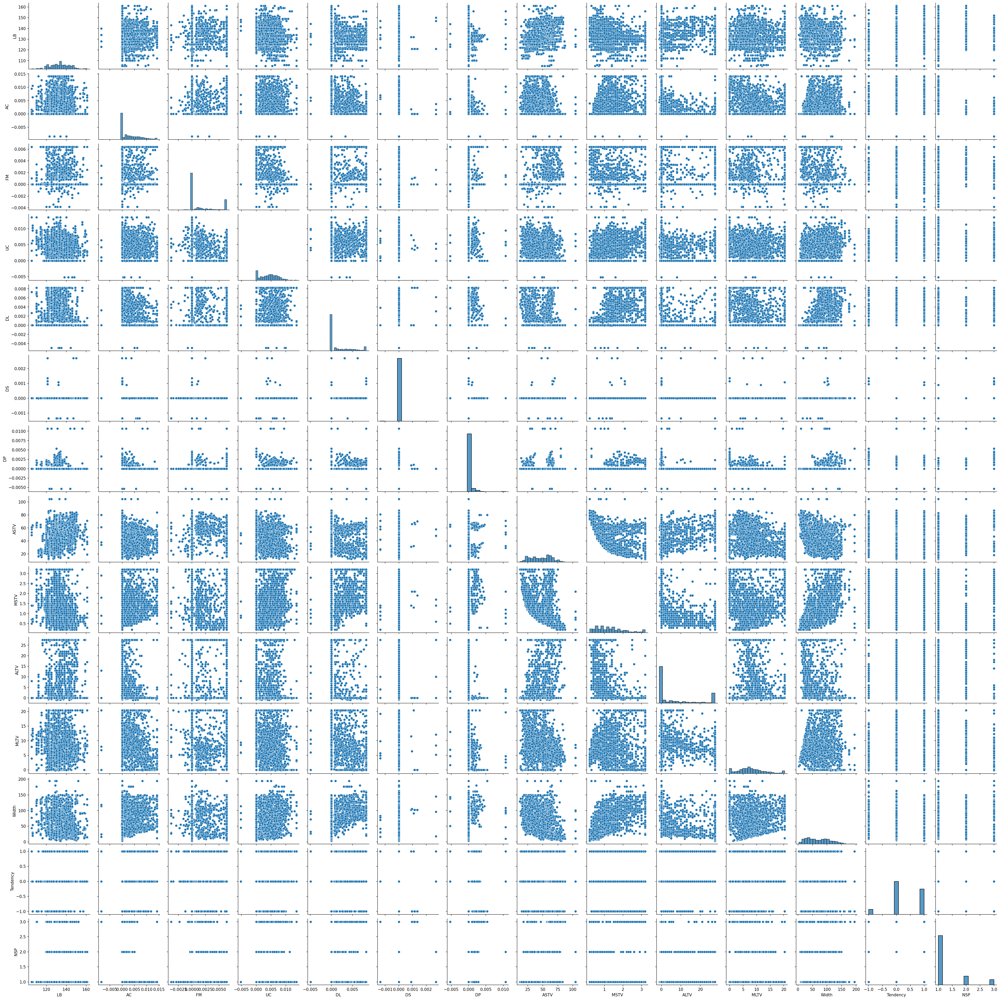

In [29]:
#@title $Pairplot$

import seaborn as sns

# Create a pairplot using Seaborn
sns.pairplot(data)

# Display the pairplot
plt.show()

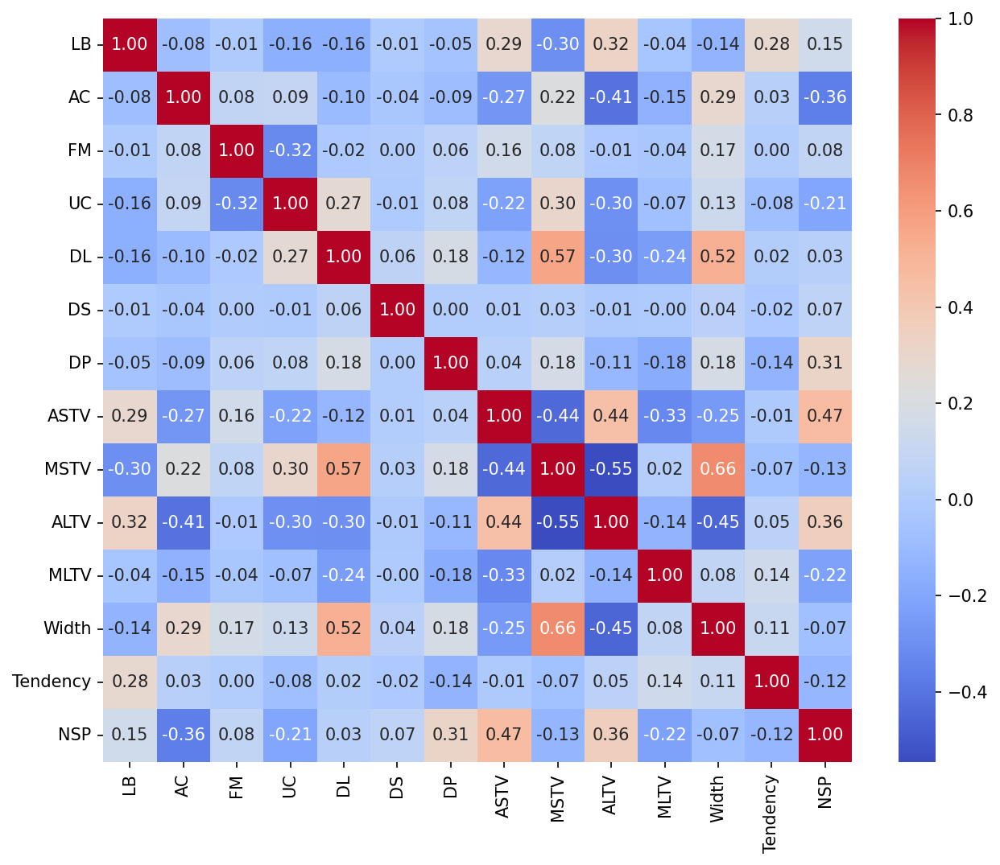

In [30]:
# @title $Correlation \ \ Matrix$
correlation_matrix = data.corr()

# Generate heatmap
fig = plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')

# Display
plt.show()

* **Note:** Insights from Pairplot and Heatmap

1) The pairplot and heatmap provide a visual overview of potential relationships between variables.

2) While some correlations are observed, further analysis is needed to establish causal links and understand the underlying mechanisms.

3) The visualizations suggest that the dataset contains a diverse range of features with varying degrees of interdependence.

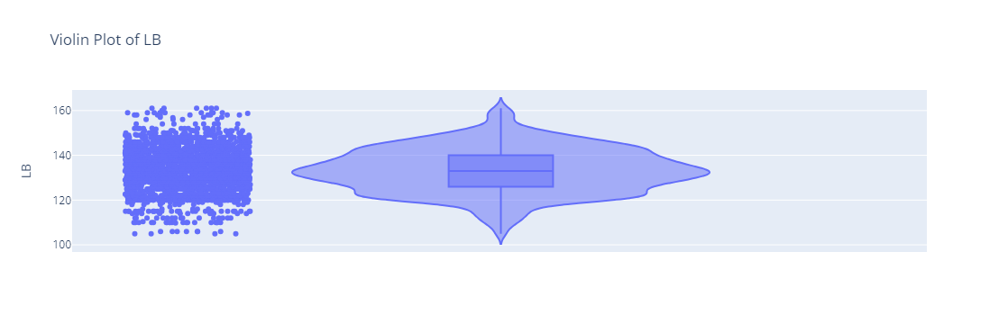

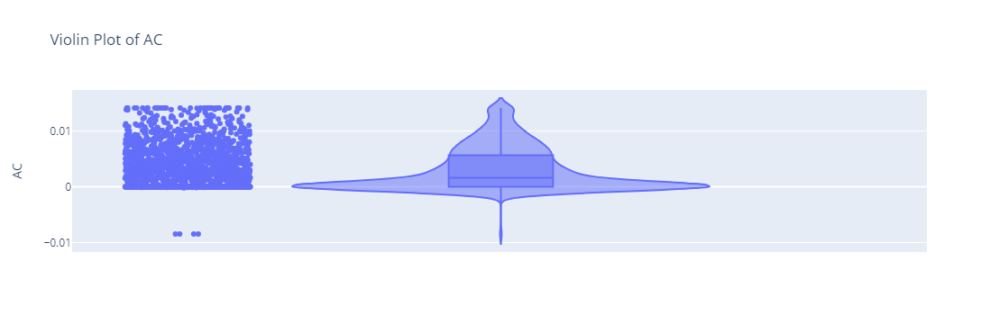

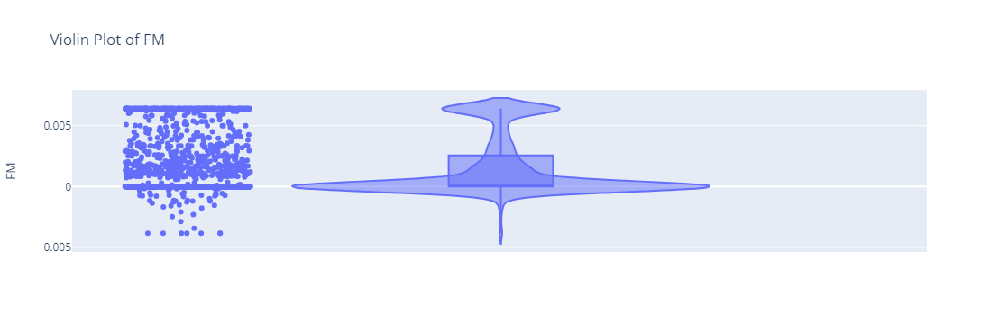

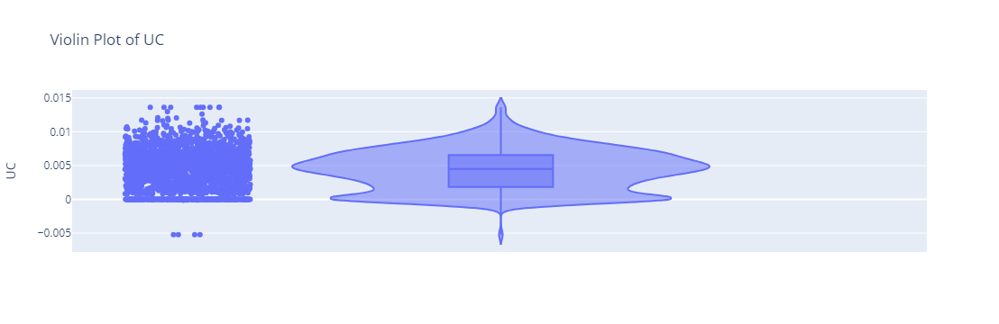

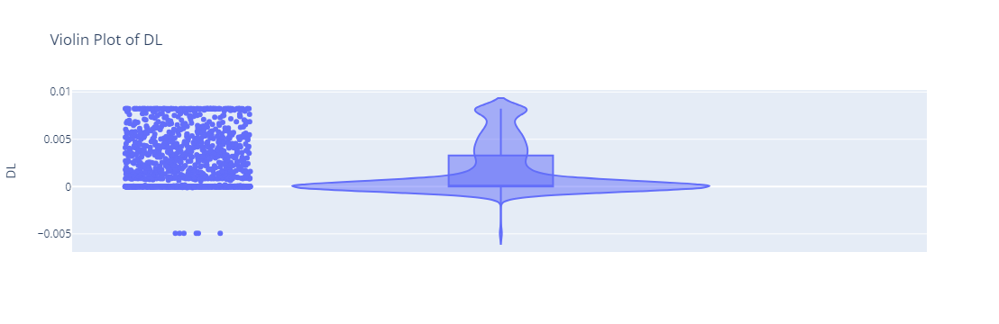

...

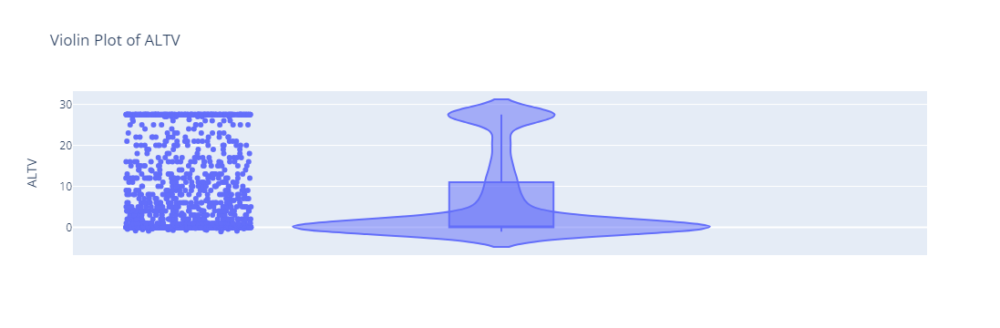

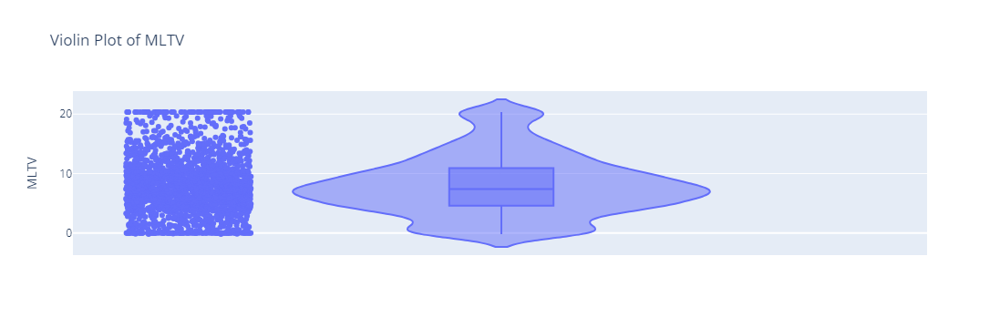

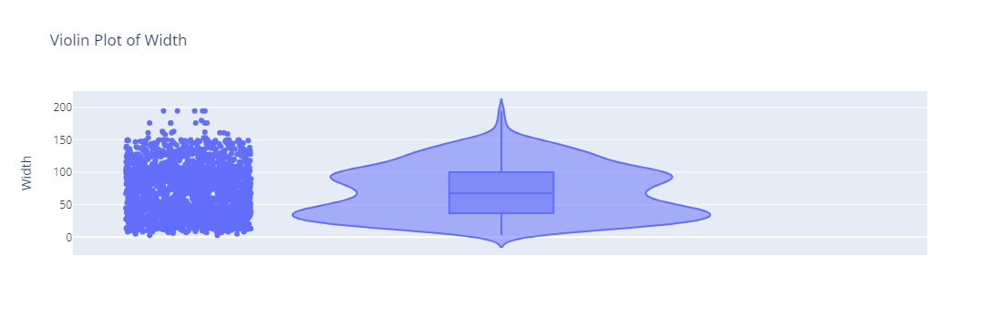

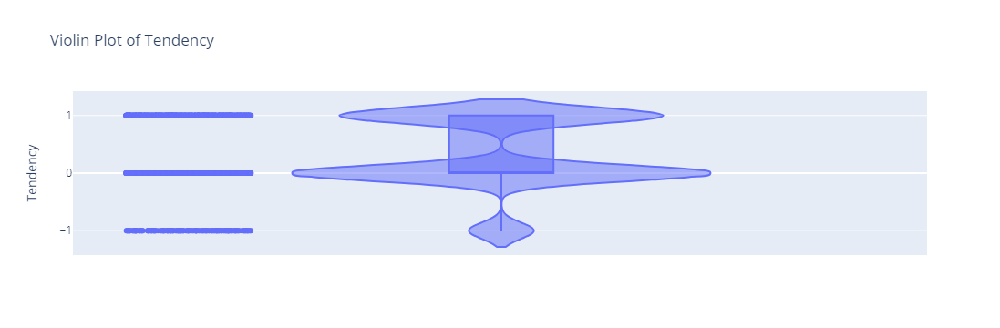

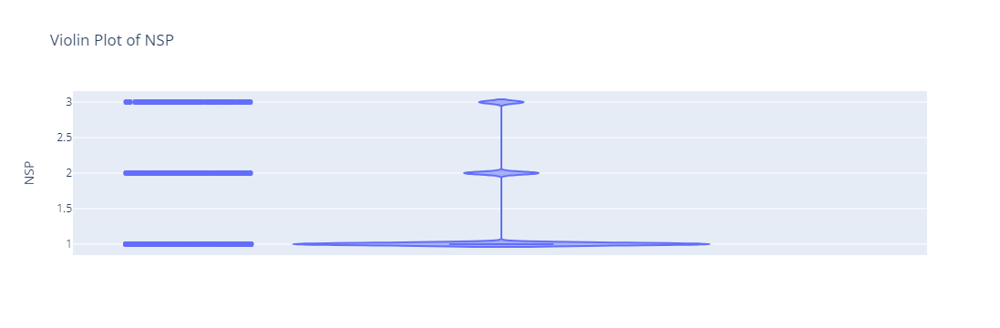

In [31]:
# @title $Violin \ \ Plot$

# Violin Plots
for col in data.columns:
    fig = px.violin(data, y=col, box=True, points='all', title=f"Violin Plot of {col}")
    fig.show()


# 5.	Conclusion:

## Summery

1) High standard deviation in features like 'LB', 'ASTV', 'ALTV', 'MLTV', 'Width' indicates significant variability.

2) Different scales of columns need to be considered during analysis and visualization.

3) Histograms reveal the distribution of numerical variables.

4) Pie charts show the frequency of categories for 'Tendency' and 'NSP', indicating a bias towards certain categories.

5) Pairplot and heatmap suggest potential relationships between variables, but further analysis is needed to establish causality.

6) Violin plots provide insights into the distribution and density of each variable.

## Recommendations

1) Domain Expertise: Consult with medical professionals or experts in the field to interpret findings and gain deeper insights into the clinical significance of the data.

2) Imbalanced Data: Address the class imbalance in 'Tendency' and 'NSP' using techniques like oversampling, undersampling, or cost-sensitive learning.